In [52]:
import pandas as pd
import numpy as np

from catboost import CatBoostClassifier

import optuna
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, make_scorer, RocCurveDisplay, auc, roc_curve

import math

from scipy import stats
import featuretools as ft

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'


import warnings
warnings.filterwarnings("ignore")

In [117]:
train_df = pd.read_parquet('train.parquet')
test_df = pd.read_parquet('test.parquet')

In [118]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      80000 non-null  int64  
 1   dates   80000 non-null  object 
 2   values  80000 non-null  object 
 3   label   80000 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 2.4+ MB


Проверим на дубликаты

In [119]:
train_df['values_as_tup'] = train_df['values'].apply(tuple)
train_df['dates_as_tup'] = train_df['dates'].apply(tuple)
duplicates = train_df[train_df.duplicated('values_as_tup', keep=False)]
duplicates.sort_values(by=['values_as_tup', 'label'])

,id,dates,values,label,values_as_tup,dates_as_tup
22133,58074,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...",0.0,"(0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
22568,61968,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...",0.0,"(0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
60837,96496,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...",0.0,"(0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.2...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
14265,61949,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...",0.0,"(0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
50575,8970,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...",0.0,"(0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
19055,9894,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...",0.0,"(0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
70050,90503,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...",0.0,"(0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.3...","(2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0..."
3975,29880,"[2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0...","[1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...",1.0,"(1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...","(2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0..."
6192,74159,"[2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0...","[1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...",1.0,"(1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...","(2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0..."
35408,20005,"[2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0...","[1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...",1.0,"(1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6...","(2017-01-01, 2017-02-01, 2017-03-01, 2017-04-0..."


В данных есть непротиворечащие дубликаты и противоречащие (одинаковые значения, но разные метки классов). Можно попробовать дедуплицировать те записи, которые совпадают полностью (дата, значения, класс) и оставить все те, которые несовпадают по времени и удалить те, которые совпадают по времени и значению, но имеют разные метки классов. Тогда, можно попробовать использовать дату начала временного ряда как доп признак

In [120]:
try:
    # Убираем нормальные дубликаты
    train_df.drop_duplicates(subset=['dates_as_tup', 'values_as_tup', 'label'], inplace=True)

    # Убираем противоречащие данные
    temp = train_df.groupby(['values_as_tup', 'dates_as_tup']).agg(id_count=("id", "count"), label_sum=("label", "sum")).reset_index()
    temp = temp[(temp['id_count'] > 1) & (temp['label_sum'] != 0) & (temp['label_sum'] != temp['id_count'])]
    id_to_delete = train_df[train_df['dates_as_tup'].isin(temp['dates_as_tup']) & train_df['values_as_tup'].isin(temp['values_as_tup'])]['id']
    train_df = train_df[~train_df['id'].isin(id_to_delete)]

    train_df.drop(['dates_as_tup', 'values_as_tup'], axis=1, inplace=True)
except:
    print("")    

train_df.shape    

(79989, 4)

In [121]:
test_df['values_as_tup'] = test_df['values'].apply(tuple)
test_df_duplicates = test_df[test_df.duplicated('values_as_tup', keep=False)]
test_df_duplicates.sort_values(by=['values_as_tup'])

,id,dates,values,values_as_tup
5834,72748,"[2017-05-01, 2017-06-01, 2017-07-01, 2017-08-0...","[6.08, -0.16, -0.16, -0.16, -0.16, -0.16, -0.1...","(6.08, -0.16, -0.16, -0.16, -0.16, -0.16, -0.1..."
18674,10511,"[2016-10-01, 2016-11-01, 2016-12-01, 2017-01-0...","[6.08, -0.16, -0.16, -0.16, -0.16, -0.16, -0.1...","(6.08, -0.16, -0.16, -0.16, -0.16, -0.16, -0.1..."
7746,93449,"[2017-05-01, 2017-06-01, 2017-07-01, 2017-08-0...","[7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1...","(7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1..."
13765,64492,"[2018-01-01, 2018-02-01, 2018-03-01, 2018-04-0...","[7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1...","(7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1..."
14396,94315,"[2017-02-01, 2017-03-01, 2017-04-01, 2017-05-0...","[7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1...","(7.14, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1..."
1957,7400,"[2016-08-01, 2016-09-01, 2016-10-01, 2016-11-0...","[7.21, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1...","(7.21, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1..."
16668,16440,"[2019-06-01, 2019-07-01, 2019-08-01, 2019-09-0...","[7.21, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1...","(7.21, -0.14, -0.14, -0.14, -0.14, -0.14, -0.1..."
8463,16293,"[2016-04-01, 2016-05-01, 2016-06-01, 2016-07-0...","[7.35, -0.13, -0.13, -0.13, -0.13, -0.13, -0.1...","(7.35, -0.13, -0.13, -0.13, -0.13, -0.13, -0.1..."
17956,19132,"[2017-04-01, 2017-05-01, 2017-06-01, 2017-07-0...","[7.35, -0.13, -0.13, -0.13, -0.13, -0.13, -0.1...","(7.35, -0.13, -0.13, -0.13, -0.13, -0.13, -0.1..."


В тестовых данных тоже присутствуют дубли временных рядов, но происходят процессы в разные даты. Добавим дату начала вр в качестве отдельного столбца.

In [122]:
train_df['ts_year'] = train_df['dates'].apply(lambda x: x[0].year)
train_df['ts_month'] = train_df['dates'].apply(lambda x: x[0].month)
train_df.head(5)

,id,dates,values,label,ts_year,ts_month
0,19114,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[-1.86, 0.79, 1.4, 0.15, 0.0, -1.24, -1.46, 3....",0.0,2016,1
1,22769,"[2016-05-01, 2016-06-01, 2016-07-01, 2016-08-0...","[-1.04, -3.48, 0.05, -0.13, -0.01, 0.03, 0.27,...",1.0,2016,5
2,76935,"[2017-03-01, 2017-04-01, 2017-05-01, 2017-06-0...","[0.28, 0.63, 0.06, 0.96, -1.4, -0.3, 1.62, 1.1...",0.0,2017,3
3,66297,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[-0.33, 0.58, 1.1, -0.56, -0.95, -0.61, -0.7, ...",0.0,2016,1
4,2191,"[2016-01-01, 2016-02-01, 2016-03-01, 2016-04-0...","[1.31, 0.5, -0.54, 0.95, 0.65, 0.83, -1.55, -0...",0.0,2016,1


Проверим корректность данных рядов

In [123]:
for i, row in train_df.iterrows():
    if len(row['dates']) != len(row['values']):
        print(row['id'])
        raise ValueError(f"")

row_ids_with_nans = []
for i, row in train_df.iterrows():
    for val in row['values']:
        if math.isnan(val):
            row_ids_with_nans.append(row['id'])

f"Found some Time Series with nans. Count({len(set(row_ids_with_nans))}) ids: {row_ids_with_nans}" if len(row_ids_with_nans) > 0 else ""    

'Found some Time Series with nans. Count(88) ids: [95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 95215, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 56091, 5609

Нашли пустые вр:

In [124]:
train_df[train_df['id'].isin(row_ids_with_nans)].head(5)

,id,dates,values,label,ts_year,ts_month
1979,95215,"[2016-03-01, 2016-04-01, 2016-05-01, 2016-06-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.0,2016,3
2328,56091,"[2020-04-01, 2020-05-01, 2020-06-01, 2020-07-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.0,2020,4
3244,63162,"[2017-12-01, 2018-01-01, 2018-02-01, 2018-03-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",0.0,2017,12
3315,29359,"[2016-11-01, 2016-12-01, 2017-01-01, 2017-02-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",0.0,2016,11
3873,12983,"[2016-02-01, 2016-03-01, 2016-04-01, 2016-05-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",0.0,2016,2


Заодно проверим, что происходит в тестовом датасете:

In [125]:
test_row_ids_with_nans = []
for i, row in test_df.iterrows():
    for val in row['values']:
        if math.isnan(val):
            test_row_ids_with_nans.append(row['id'])

f"Found some Time Series with nans count({len(set(test_row_ids_with_nans))}) ids: {test_row_ids_with_nans}" if len(test_row_ids_with_nans) > 0 else ""    

'Found some Time Series with nans count(21) ids: [5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 5992, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70218, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630, 70630

In [126]:
test_df[test_df['id'].isin(test_row_ids_with_nans)].head(5)

,id,dates,values,values_as_tup
361,5992,"[2016-03-01, 2016-04-01, 2016-05-01, 2016-06-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","(nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
922,70218,"[2016-05-01, 2016-06-01, 2016-07-01, 2016-08-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","(nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
2193,70630,"[2017-08-01, 2017-09-01, 2017-10-01, 2017-11-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","(nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
4050,44222,"[2020-04-01, 2020-05-01, 2020-06-01, 2020-07-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","(nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
6260,85761,"[2020-04-01, 2020-05-01, 2020-06-01, 2020-07-0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","(nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."


Просто так исключать `nan` ряды нельзя, так как в тесте присутствуют такие же. Для них скорее всего придется либо ставить случайную метку либо ориентироваться на пропорции классов в данную дату.


Проверим, что даты находятся в консистентном состоянии:

In [127]:
def check_date_consistency(dates_column: pd.Series): 
    for dates in dates_column:
        for i in range(1, len(dates)):
            delta = dates[i] - dates[i - 1]
            if delta.days > 31:
                raise ValueError("Missing date")
            if dates[i] == dates[i - 1]:
                raise ValueError("Same date at the next step")
    print("Check complete")

check_date_consistency(train_df['dates']), check_date_consistency(test_df['dates'])

Check complete
Check complete


(None, None)

In [128]:
from typing import List

def len_inconsistency(df: pd.DataFrame) -> List[int]:
    ids = []
    for _, row in df.iterrows():
        if len(row['dates']) != len(row['values']):
            ids.append(row['id'])

    return ids        

len_inconsistency(train_df), len_inconsistency(test_df)

([], [])

### Графический анализ

Распределение классов в обучающей выборке

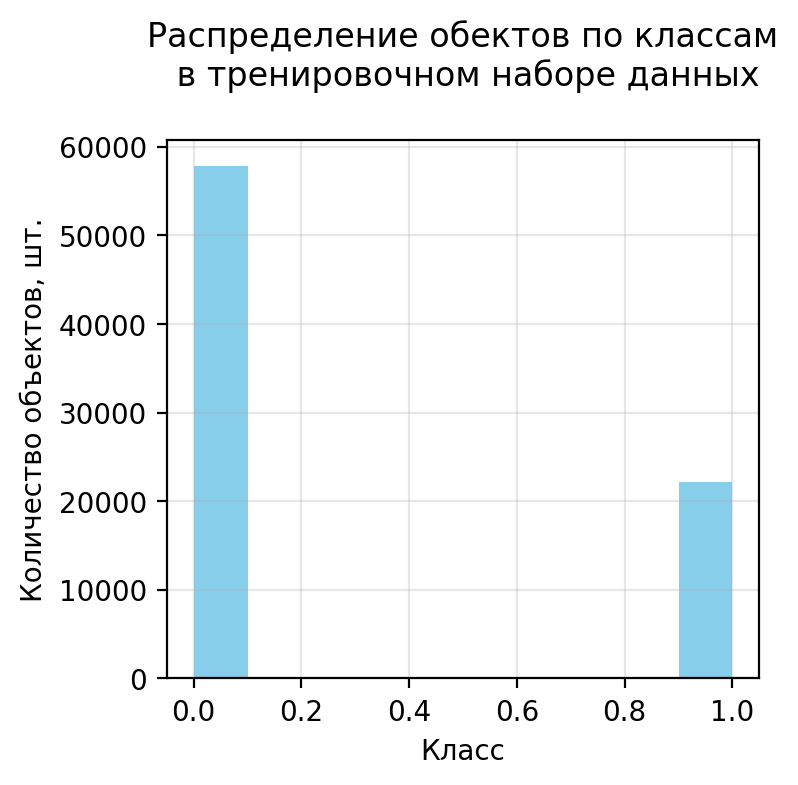

In [129]:
plt.figure(figsize=(4, 4))
plt.hist(train_df['label'], color='skyblue')

plt.title("Распределение обектов по классам\n в тренировочном наборе данных\n")
plt.xlabel("Класс")
plt.ylabel("Количество объектов, шт.")
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Наблюдаем дисбаланс классов. Распределение надо учесть при валидации, например, использовать стратификацию.

Для дальнейшего анализа пока выберем ряды без `nan` значений:

In [130]:
train_wn_df = train_df[~train_df['id'].isin(row_ids_with_nans)].copy()
train_wn_df.shape

(79901, 6)

Посмотрим на графики временных рядов в осях среднего значения и дисперсии

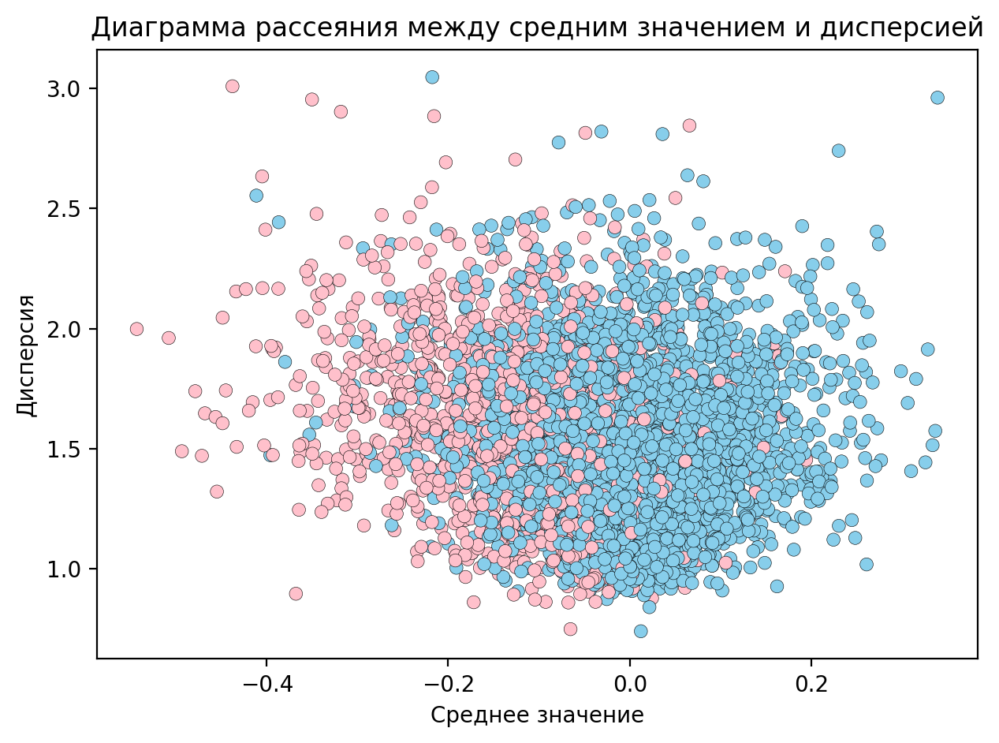

In [135]:
vis = train_wn_df.sample(5000)

plt.scatter(vis['values'].apply(lambda x: x.mean()), 
            vis['values'].apply(lambda x: x.var()), 
            c=vis['label'].apply(lambda x: "skyblue" if x == 0 else "pink"), 
            edgecolors= "black", 
            linewidth=0.2)

plt.title("Диаграмма рассеяния между средним значением и дисперсией")

plt.xlabel("Среднее значение")
plt.ylabel("Дисперсия")

plt.tight_layout()
plt.show()

Видим, что распределения точек, хоть и накладываются друг на друга, но в принципе могут стать хорошими признаками

In [136]:
train_wn_df['mean'] = train_wn_df['values'].apply(lambda x: x.mean())
train_wn_df['var'] = train_wn_df['values'].apply(lambda x: x.var())

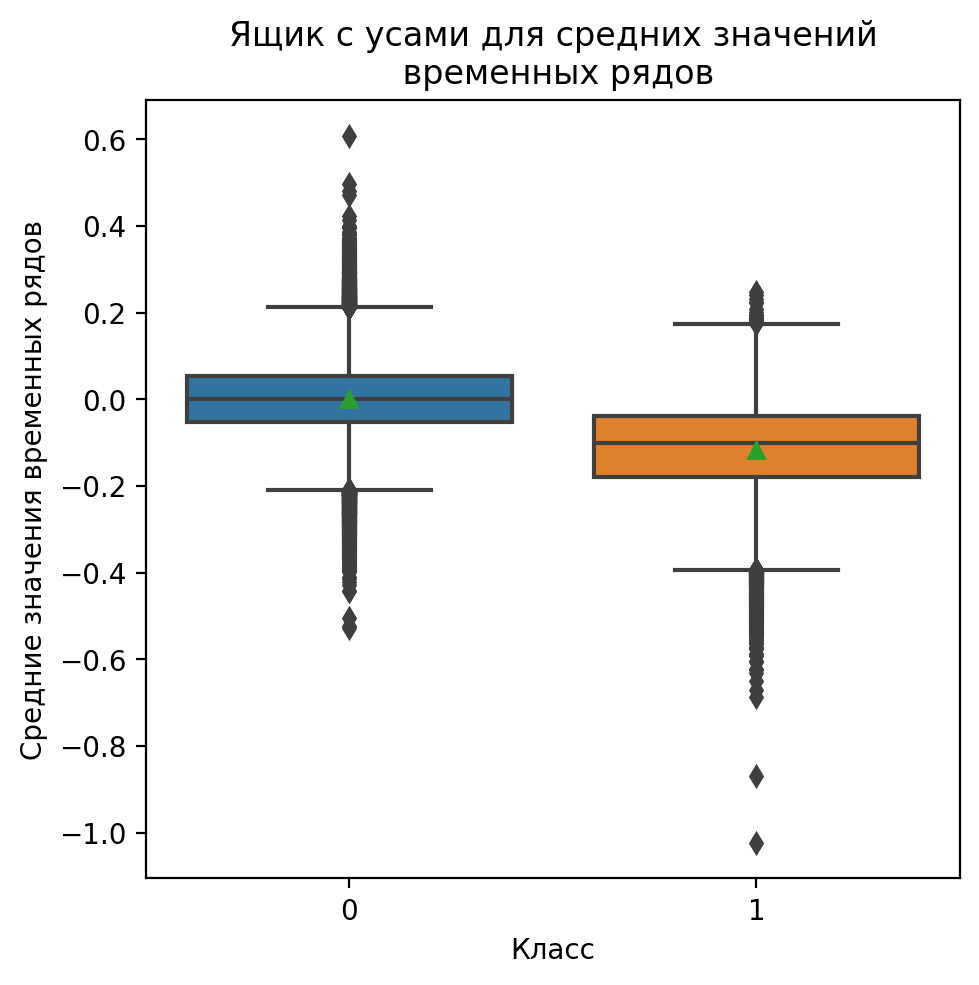

In [137]:
plt.figure(figsize=(5, 5))

sns.boxplot(data=[train_wn_df[train_wn_df['label'] == 0]['mean'], train_wn_df[train_wn_df['label'] == 1]['mean']], showmeans=True)

plt.title("Ящик с усами для средних значений\n временных рядов")
plt.xlabel("Класс")
plt.ylabel("Средние значения временных рядов")
plt.tight_layout()
plt.show()

Можем бахнуть t-тест на статистическое различие средних двух классов

In [138]:
train_wn_df[train_wn_df['label'] == 1]['mean'].var(), train_wn_df[train_wn_df['label'] == 0]['mean'].var()

(0.011710153724678173, 0.008389444915269382)

Дисперсии средних примерно одинаковые. Проведем тест на равенство средних значений рядов

In [139]:
_, p_value = stats.ttest_ind(train_wn_df[train_wn_df['label'] == 0]['mean'], train_wn_df[train_wn_df['label'] == 1]['mean'], equal_var=True)

# H0 - средние равны
f"p-значение меньше {p_value} < alpha = 0.05 отвергаем H0" if p_value < 0.05 else "не можем отвергнть H0"

'p-значение меньше 0.0 < alpha = 0.05 отвергаем H0'

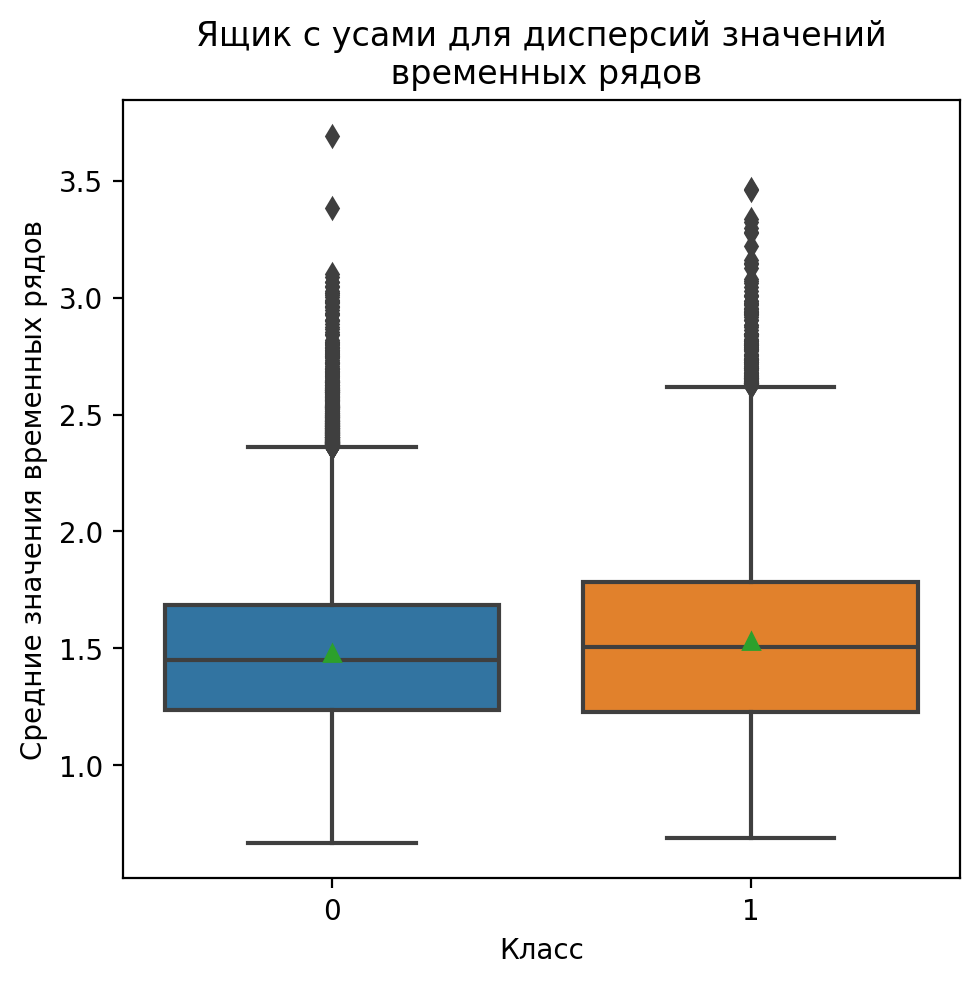

In [140]:
plt.figure(figsize=(5, 5))

sns.boxplot(data=[train_wn_df[train_wn_df['label'] == 0]['var'], train_wn_df[train_wn_df['label'] == 1]['var']], showmeans=True)

plt.title("Ящик с усами для дисперсий значений\n временных рядов")
plt.xlabel("Класс")
plt.ylabel("Средние значения временных рядов")
plt.tight_layout()
plt.show()

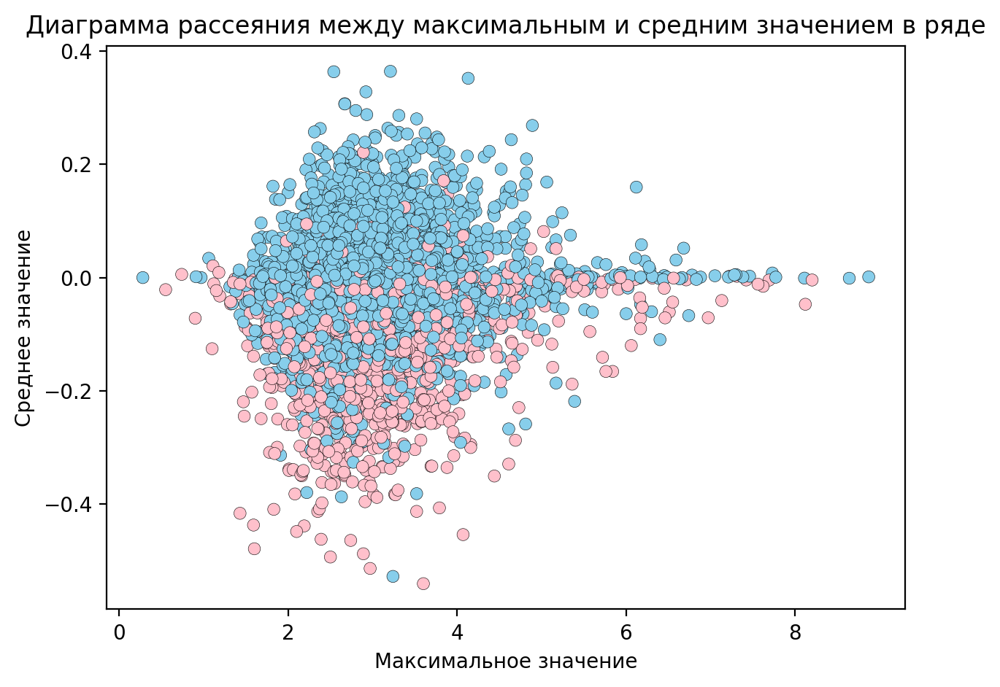

In [141]:
vis = train_wn_df.sample(5000)

plt.scatter(vis['values'].apply(lambda x: x.max()), 
            vis['values'].apply(lambda x: x.mean()), 
            c=vis['label'].apply(lambda x: "skyblue" if x == 0 else "pink"), 
            edgecolors= "black", 
            linewidth=0.2)

plt.title("Диаграмма рассеяния между максимальным и средним значением в ряде")

plt.xlabel("Максимальное значение")
plt.ylabel("Среднее значение")

plt.tight_layout()
plt.show()

In [142]:
train_wn_df['max'] = train_wn_df['values'].apply(lambda x: x.max())

In [143]:
_, p_value = stats.ttest_ind(train_wn_df[train_wn_df['label'] == 0]['max'], train_wn_df[train_wn_df['label'] == 1]['max'], equal_var=True)

# H0 - средние равны
f"p-значение меньше {p_value} < alpha = 0.05 отвергаем H0" if p_value < 0.05 else "не можем отвергнть H0"

'p-значение меньше 0.014759760300350588 < alpha = 0.05 отвергаем H0'

### Анализ коэффициентов разложения Фурье

Применим к рядам преобразование Фурье и исследуем коэффициенты:

In [144]:
fft = train_wn_df['values'].apply(lambda x: np.fft.fft(x))

for i in range(5):
    train_wn_df[f'f_coeff_{i}_real'] = fft.apply(lambda x: x[i].real)
    train_wn_df[f'f_coeff_{i}_imag'] = fft.apply(lambda x: x[i].imag)
    train_wn_df[f'f_coeff_{i}_angle'] = fft.apply(lambda x: np.angle(x[i]))

Диаграммы парных отношений для первых 5 амплитуд

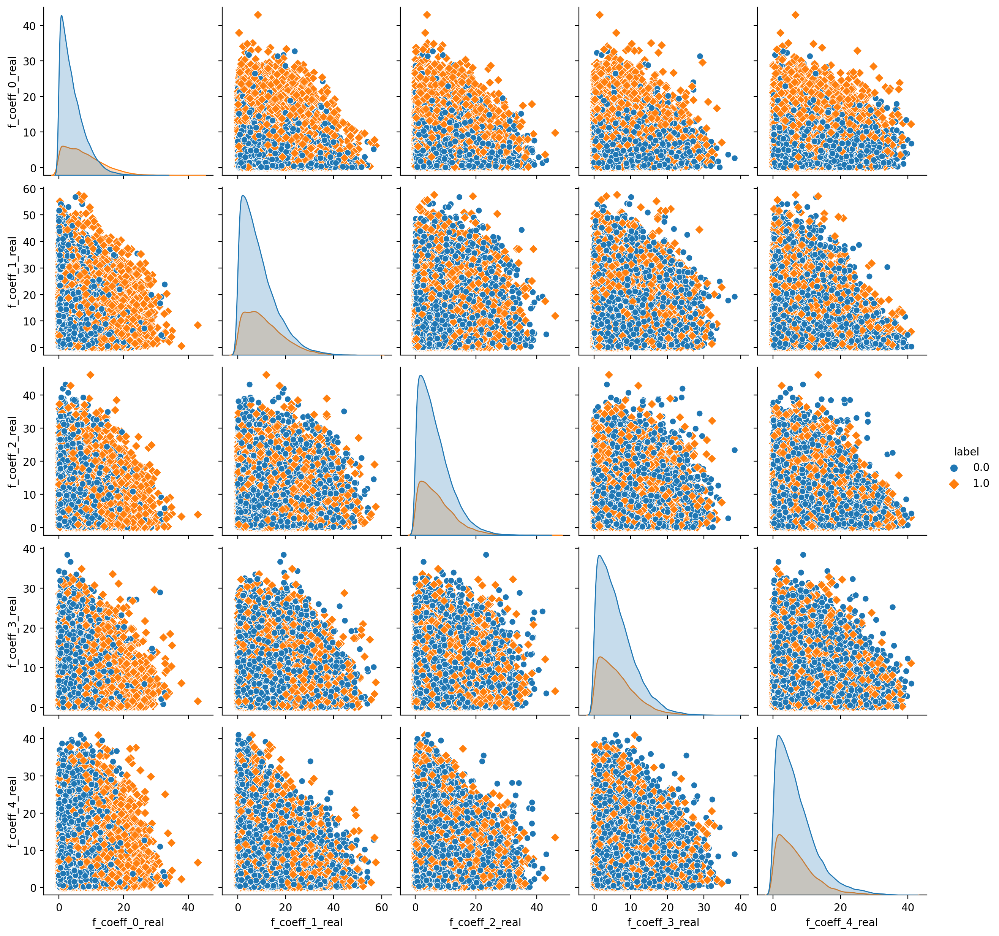

In [145]:
fft_real_colums = [f'f_coeff_{i}_real' for i in range(5)]
amplitudes = train_wn_df[fft_real_colums].abs()

df = pd.DataFrame(np.column_stack((amplitudes, train_wn_df['label'])), columns=fft_real_colums + ['label'])

sns.pairplot(df, hue='label', markers=["o", "D"])
plt.show()

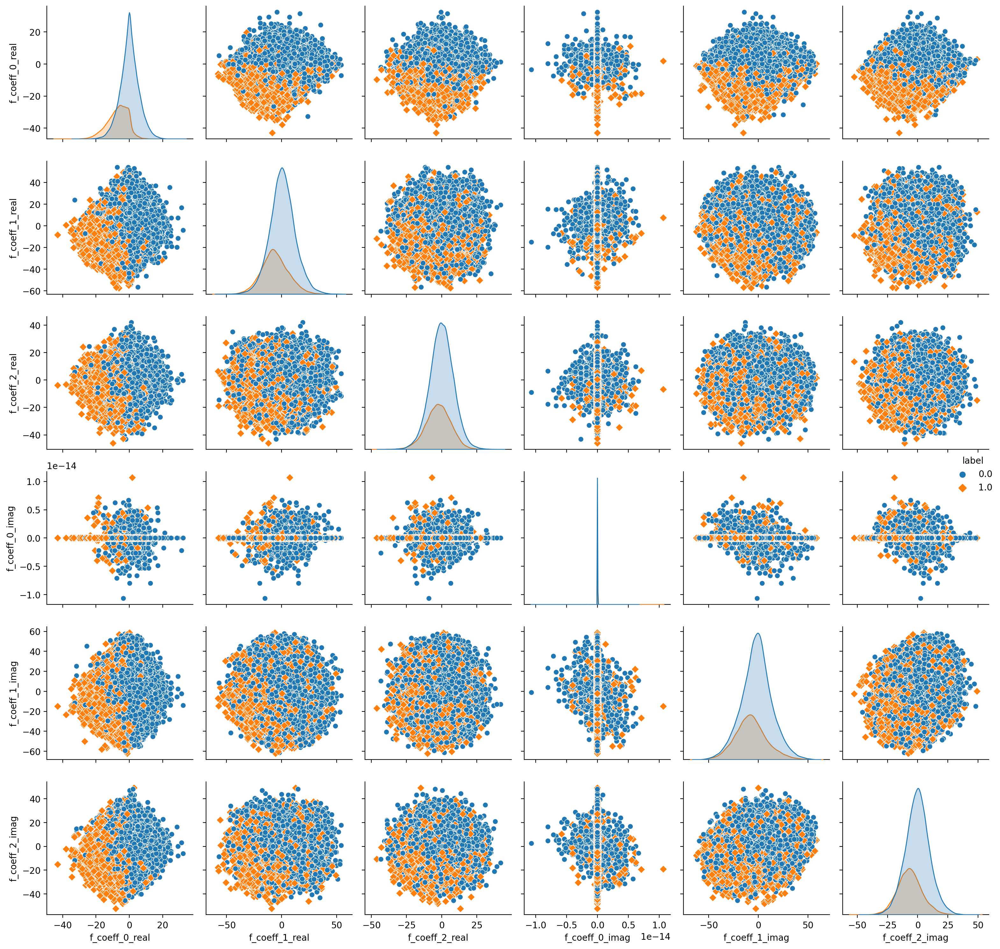

In [146]:
fft_real_colums = [f'f_coeff_{i}_real' for i in range(3)]
fft_imag_colums = [f'f_coeff_{i}_imag' for i in range(3)]

total_cols = fft_real_colums + fft_imag_colums

amplitudes = train_wn_df[total_cols]

df = pd.DataFrame(np.column_stack((amplitudes, train_wn_df['label'])), columns=total_cols + ['label'])

sns.pairplot(df, hue='label', markers=["o", "D"])

plt.tight_layout()
plt.show()

Действительные и мнимые части коэффициентов Фурье в совокопности могут стать хорошими предикторами для модели

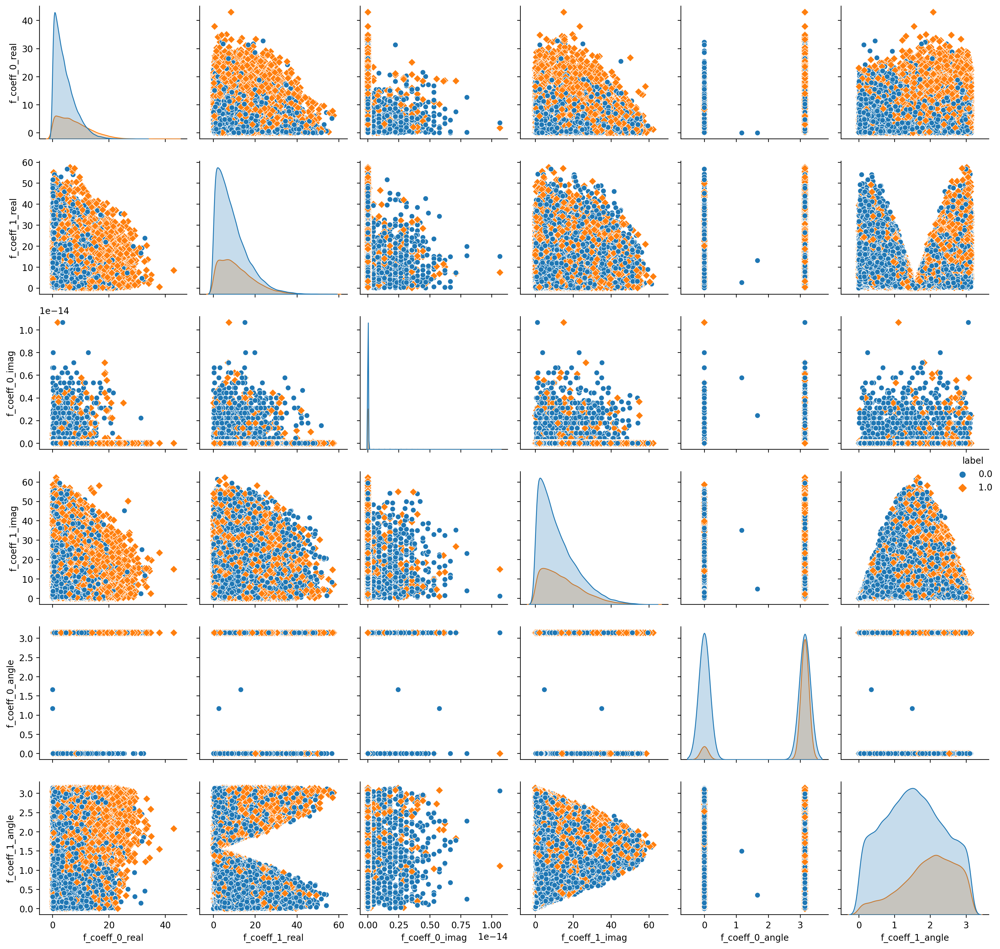

In [147]:
fft_real_colums = [f'f_coeff_{i}_real' for i in range(2)]
fft_imag_colums = [f'f_coeff_{i}_imag' for i in range(2)]
fft_angle_colums = [f'f_coeff_{i}_angle' for i in range(2)]

total_cols = fft_real_colums + fft_imag_colums + fft_angle_colums

amplitudes = train_wn_df[total_cols].abs()

df = pd.DataFrame(np.column_stack((amplitudes, train_wn_df['label'])), columns=total_cols + ['label'])

sns.pairplot(df, hue='label', markers=["o", "D"])

plt.tight_layout()
plt.show()

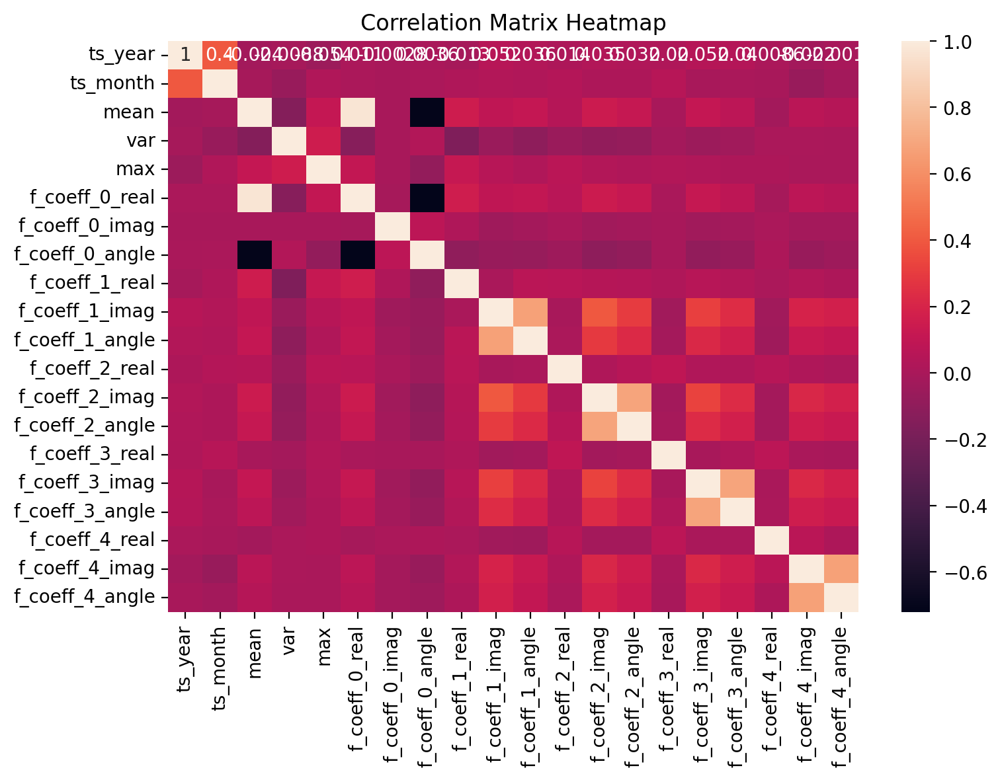

In [148]:
corr_matrix = train_wn_df.drop(['id', 'values', 'label', 'dates'], axis=1).corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Matrix Heatmap')

plt.tight_layout()
plt.show()

`f_coeff_0_real` линейно коррелирует со средним,  можем избавиться, чтобы не мешало

#### Подбор гиперпараметров модели

#### Catboost classifier и Optuna

In [153]:
exclude_features = ['id', 'values', 'dates', 'f_coeff_0_real']

cat_features = ['ts_year', 'ts_month']

final_df = pd.concat([train_wn_df, train_df[train_df['id'].isin(row_ids_with_nans)]], axis=0).drop(exclude_features, axis=1)

final_df['ts_year'] = final_df['ts_year'].astype(str)
final_df['ts_month'] = final_df['ts_month'].astype(str)

In [155]:
X = final_df.drop('label', axis=1)
y = final_df['label']

In [156]:

def objective(trial):
    
    param = {
        "random_state": 42,
        "objective": trial.suggest_categorical("objective", ["Logloss"]),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 7),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical(
            "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
        )
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    roc_aucs = []
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for train_index, test_index in skf.split(X=X, y=y):

        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        clf = CatBoostClassifier(**param)
        clf.fit(X=X_train, 
                y=y_train, 
                eval_set=(X_test, y_test), 
                use_best_model=True,
                cat_features=cat_features,
                verbose=0)
        
        y_pred_prob = clf.predict_proba(X_test)
        roc_aucs.append(roc_auc_score(y_true=y_test, y_score=y_pred_prob[:, 1]))

    roc_aucs = np.array(roc_aucs)
    print(f"Mean {roc_aucs.mean()}, std {roc_aucs.std()}")
    return roc_aucs.mean() - roc_aucs.std()

In [157]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100, timeout=600)

[I 2024-10-23 20:39:36,619] A new study created in memory with name: no-name-7dd3d8fc-26a3-49d7-a158-0e83c55fceb4
[I 2024-10-23 20:40:33,287] Trial 0 finished with value: 0.9055694803966403 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.0803433199478989, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9069477571453455, std 0.0013782767487051212


[I 2024-10-23 20:41:24,544] Trial 1 finished with value: 0.8949785372381062 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.09404190737403105, 'depth': 3, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 3.904869702617768}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.896699238322992, std 0.0017207010848858892


[I 2024-10-23 20:41:53,316] Trial 2 finished with value: 0.8855490364243684 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.09664227878317709, 'depth': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.3317335407857595}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.8872969088299099, std 0.0017478724055414103


[I 2024-10-23 20:42:29,244] Trial 3 finished with value: 0.9026696329154521 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.07251736655315648, 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9038800353543213, std 0.0012104024388691979


[I 2024-10-23 20:42:58,971] Trial 4 finished with value: 0.8915231995146624 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.03491761579115243, 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.893884862036525, std 0.002361662521862595


[I 2024-10-23 20:43:29,192] Trial 5 finished with value: 0.8917304548033309 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.042303807925405765, 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 9.035323332977743}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.8937135351205704, std 0.0019830803172395067


[I 2024-10-23 20:44:12,432] Trial 6 finished with value: 0.8858172749420821 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.09732990305675529, 'depth': 1, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8189013517277546}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.8873787272503234, std 0.0015614523082413227


[I 2024-10-23 20:44:38,406] Trial 7 finished with value: 0.8723482274788686 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.013929903182095943, 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 1.7113699681824135}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.8756495827308604, std 0.003301355251991725


[I 2024-10-23 20:45:22,293] Trial 8 finished with value: 0.8929675028050509 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.03761745654118132, 'depth': 5, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8095633044185118}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.8950321019833523, std 0.0020645991783013436


[I 2024-10-23 20:46:09,382] Trial 9 finished with value: 0.9009266258700807 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.05492659048770913, 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9027396636858172, std 0.0018130378157364486


[I 2024-10-23 20:47:05,879] Trial 10 finished with value: 0.9052336958086753 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.07695607460974009, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9064629308803859, std 0.001229235071710632


[I 2024-10-23 20:47:59,965] Trial 11 finished with value: 0.9051266093023996 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.07397052967901054, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.906403996596941, std 0.0012773872945414317


[I 2024-10-23 20:48:56,028] Trial 12 finished with value: 0.9054109605733887 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.07587348116484412, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9068518439096616, std 0.0014408833362729203


[I 2024-10-23 20:49:45,717] Trial 13 finished with value: 0.9037122797563395 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.06285669081940416, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9055694803966403.


Mean 0.9049864342127891, std 0.0012741544564496418


In [158]:
study.best_params

{'objective': 'Logloss',
 'colsample_bylevel': 0.0803433199478989,
 'depth': 7,
 'boosting_type': 'Ordered',
 'bootstrap_type': 'MVS'}

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.9, random_state=42, stratify=y)

clf = CatBoostClassifier(**study.best_params)
clf.fit(X=X_train, 
                y=y_train, 
                eval_set=(X_test, y_test), 
                use_best_model=True,
                cat_features=cat_features,
                verbose=0)

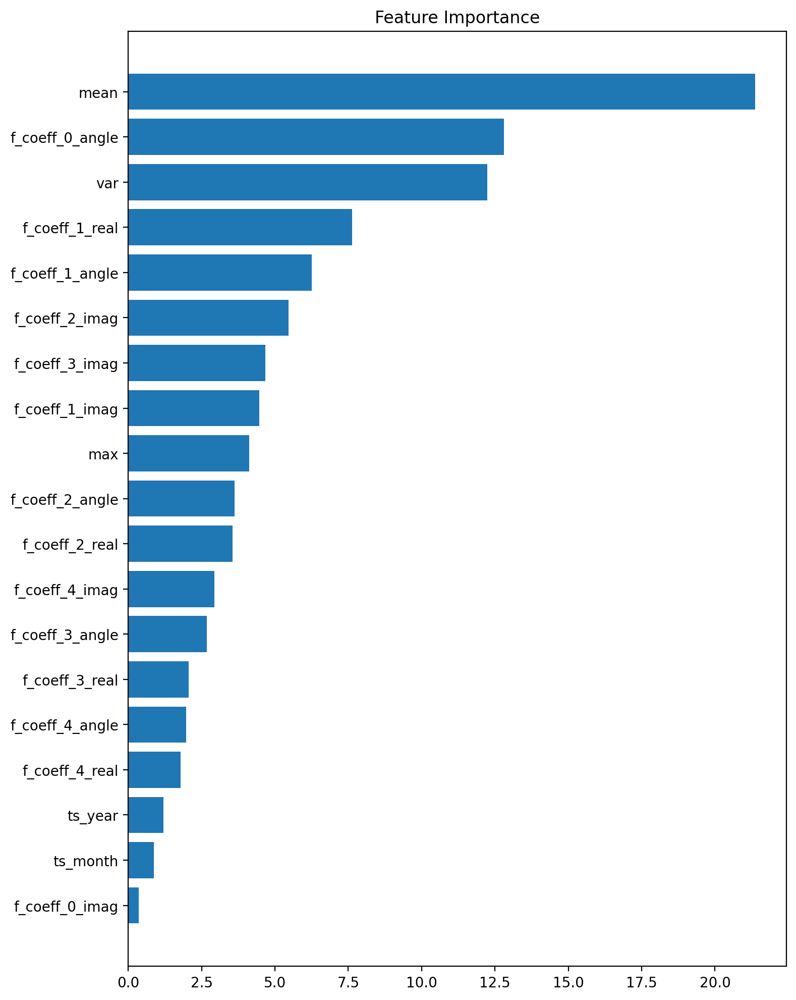

In [160]:

feature_importance = clf.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(8, 10))

plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance')

plt.tight_layout()
plt.show()

Построим `ROC` кривую и посчитаем `AUC`

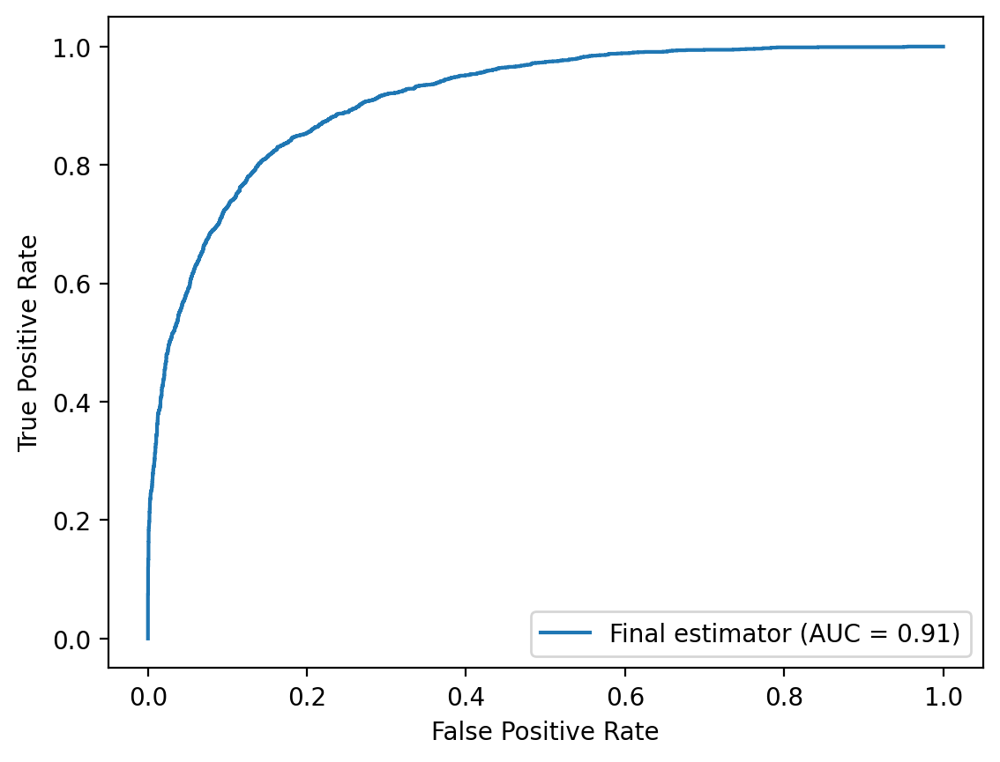

In [161]:
y = y_test
pred = clf.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y, pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,
                                  estimator_name='Final estimator')

display.plot()
plt.show()

Не самый лучший результат, если генерировать все подряд и пихать в модель, можно выбить 0.94, но глаза разъезжаются, если потом анализировать все это через shap

#### Сохраняем модель

Обработку тестовых данных и формирование сабмишена смотреть в `prediction.ipynb`

In [162]:
clf.save_model("trained_model", format="cbm")